In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import os
from PIL import Image, ImageOps
from tensorflow.keras import layers
import tensorflow as tf
import random
import shutil
import cv2


In [ ]:
import numpy as np
import tensorflow as tf
from glob import glob

IMAGE_SIZE = 256
IMAGE_TRAIN_NUMBER = 400
BATCH_SIZE = 16

def compute_psnr(original_img, enhanced_img):
    original_img = np.array(original_img)
    enhanced_img = np.array(enhanced_img)
    mean_squared_error = np.mean((original_img - enhanced_img) ** 2)
    max_pixel_value = 255.0
    psnr_value = 20 * np.log10(max_pixel_value / np.sqrt(mean_squared_error))
    return psnr_value

def load_image(path_of_image):
    image_data = tf.io.read_file(path_of_image)
    image = tf.image.decode_png(image_data, channels=3)
    image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image

def generate_dataset(paths_of_image):
    dataset = tf.data.Dataset.from_tensor_slices(paths_of_image)
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

train_image_paths = sorted(glob("/content/drive/MyDrive/Train/low/*"))[:IMAGE_TRAIN_NUMBER]
val_image_paths = sorted(glob("/content/drive/MyDrive/Train/low/*"))[IMAGE_TRAIN_NUMBER:]
test_image_paths = sorted(glob("/content/drive/MyDrive/Train/low/*"))
high_light_images = sorted(glob("/content/drive/MyDrive/Train/high/*"))


print("Number of training images:", len(train_image_paths))

val_dataset = generate_dataset(val_image_paths)
train_dataset = generate_dataset(train_image_paths)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)


Number of training images: 400
Train Dataset: <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset: <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>


In [ ]:
def exposure_loss(image, average_val=0.6):
    image = tf.reduce_mean(image, axis=3, keepdims=True)
    average = tf.nn.avg_pool2d(image, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(average - average_val))

In [ ]:
def illumination_smoothness_loss(img):
    batch_size = tf.shape(img)[0]
    height = tf.shape(img)[1]
    width = tf.shape(img)[2]
    count_horizontal = (tf.shape(img)[2] - 1) * tf.shape(img)[3]
    count_vertical = tf.shape(img)[2] * (tf.shape(img)[3] - 1)
    tv_horizontal = tf.reduce_sum(tf.square(img[:, 1:, :, :] - img[:, :height-1, :, :]))
    tv_vertical = tf.reduce_sum(tf.square(img[:, :, 1:, :] - img[:, :, :width-1, :]))
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_horizontal = tf.cast(count_horizontal, dtype=tf.float32)
    count_vertical = tf.cast(count_vertical, dtype=tf.float32)
    return 2 * (tv_horizontal / count_horizontal + tv_vertical / count_vertical) / batch_size



In [ ]:
class SpatialConsistencyLossModified(tf.keras.losses.Loss):
    def __init__(self, **kwargs):
        super(SpatialConsistencyLossModified, self).__init__(reduction="none")

        self.left_filter = tf.constant([[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32)
        self.right_filter = tf.constant([[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32)
        self.up_filter = tf.constant([[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32)
        self.down_filter = tf.constant([[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32)

    def call(self, true_values, predicted_values):
        original_mean = tf.reduce_mean(true_values, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(predicted_values, 3, keepdims=True)
        original_pool = tf.nn.avg_pool2d(original_mean, ksize=4, strides=4, padding="VALID")
        enhanced_pool = tf.nn.avg_pool2d(enhanced_mean, ksize=4, strides=4, padding="VALID")

        d_original_left = tf.nn.conv2d(original_pool, self.left_filter, strides=[1, 1, 1, 1], padding="SAME")
        d_original_right = tf.nn.conv2d(original_pool, self.right_filter, strides=[1, 1, 1, 1], padding="SAME")
        d_original_up = tf.nn.conv2d(original_pool, self.up_filter, strides=[1, 1, 1, 1], padding="SAME")
        d_original_down = tf.nn.conv2d(original_pool, self.down_filter, strides=[1, 1, 1, 1], padding="SAME")

        d_enhanced_left = tf.nn.conv2d(enhanced_pool, self.left_filter, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_right = tf.nn.conv2d(enhanced_pool, self.right_filter, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_up = tf.nn.conv2d(enhanced_pool, self.up_filter, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_down = tf.nn.conv2d(enhanced_pool, self.down_filter, strides=[1, 1, 1, 1], padding="SAME")

        diff_left = tf.square(d_original_left - d_enhanced_left)
        diff_right = tf.square(d_original_right - d_enhanced_right)
        diff_up = tf.square(d_original_up - d_enhanced_up)
        diff_down = tf.square(d_original_down - d_enhanced_down)

        return diff_left + diff_right + diff_up + diff_down


In [ ]:
def color_constancy_loss(img):
    mean_rgb = tf.reduce_mean(img, axis=(1, 2), keepdims=True)
    mean_red, mean_green, mean_blue = mean_rgb[:, :, :, 0], mean_rgb[:, :, :, 1], mean_rgb[:, :, :, 2]
    diff_red_green = tf.square(mean_red - mean_green)
    diff_red_blue = tf.square(mean_red - mean_blue)
    diff_green_blue = tf.square(mean_green - mean_blue)
    return tf.sqrt(tf.square(diff_red_green) + tf.square(diff_red_blue) + tf.square(diff_green_blue))

In [ ]:
def build_dce_network():
    input_image = tf.keras.Input(shape=[None, None, 3])
    conv_layer1 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(input_image)
    conv_layer2 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv_layer1)
    conv_layer3 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv_layer2)
    conv_layer4 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv_layer3)

    concat1 = layers.Concatenate(axis=-1)([conv_layer4, conv_layer3])
    conv_layer5 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(concat1)
    concat2 = layers.Concatenate(axis=-1)([conv_layer5, conv_layer2])
    conv_layer6 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(concat2)
    concat3 = layers.Concatenate(axis=-1)([conv_layer6, conv_layer1])
    output_layer = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(concat3)
    return tf.keras.Model(inputs=input_image, outputs=output_layer)


In [ ]:
class ZeroDCE(tf.keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.dce_net = build_dce_network()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLossModified(reduction="none")

    def enhance_image(self, data, output):
        r1, r2, r3, r4, r5, r6, r7, r8 = tf.split(output, num_or_size_splits=8, axis=-1)
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        x = x + r4 * (tf.square(x) - x)
        x = x + r5 * (tf.square(x) - x)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image

    def call(self, inputs):
        dce_net_output = self.dce_net(inputs)
        return self.enhance_image(inputs, dce_net_output)

    def compute_losses(self, inputs, outputs):
        enhanced_image = self.enhance_image(inputs, outputs)
        loss_illumination = 200 * illumination_smoothness_loss(outputs)
        loss_spatial_constancy = tf.reduce_mean(self.spatial_constancy_loss(enhanced_image, inputs))
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            outputs = self.dce_net(data)
            losses = self.compute_losses(data, outputs)
        gradients = tape.gradient(losses["total_loss"], self.dce_net.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.dce_net.trainable_weights))
        return losses

    def test_step(self, data):
        outputs = self.dce_net(data)
        return self.compute_losses(data, outputs)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """Save the weights of the DCE-Net."""
        self.dce_net.save_weights(filepath, overwrite=overwrite, save_format=save_format, options=options)

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """Load the weights of the DCE-Net."""
        self.dce_net.load_weights(filepath=filepath, by_name=by_name, skip_mismatch=skip_mismatch, options=options)


Epoch 1/40
25/25 [==============================] - 67s 2s/step - total_loss: 5.9785 - illumination_smoothness_loss: 3.0301 - spatial_constancy_loss: 4.4498e-06 - color_constancy_loss: 0.0035 - exposure_loss: 2.9449 - val_total_loss: 5.1851 - val_illumination_smoothness_loss: 2.1744 - val_spatial_constancy_loss: 4.2462e-06 - val_color_constancy_loss: 8.3267e-04 - val_exposure_loss: 3.0099
Epoch 2/40
25/25 [==============================] - 7s 265ms/step - total_loss: 4.7621 - illumination_smoothness_loss: 1.8380 - spatial_constancy_loss: 2.5872e-05 - color_constancy_loss: 0.0029 - exposure_loss: 2.9211 - val_total_loss: 4.3329 - val_illumination_smoothness_loss: 1.3429 - val_spatial_constancy_loss: 3.8451e-05 - val_color_constancy_loss: 5.0708e-04 - val_exposure_loss: 2.9895
Epoch 3/40
25/25 [==============================] - 7s 290ms/step - total_loss: 4.1265 - illumination_smoothness_loss: 1.2229 - spatial_constancy_loss: 6.9801e-05 - color_constancy_loss: 0.0028 - exposure_loss: 2.9

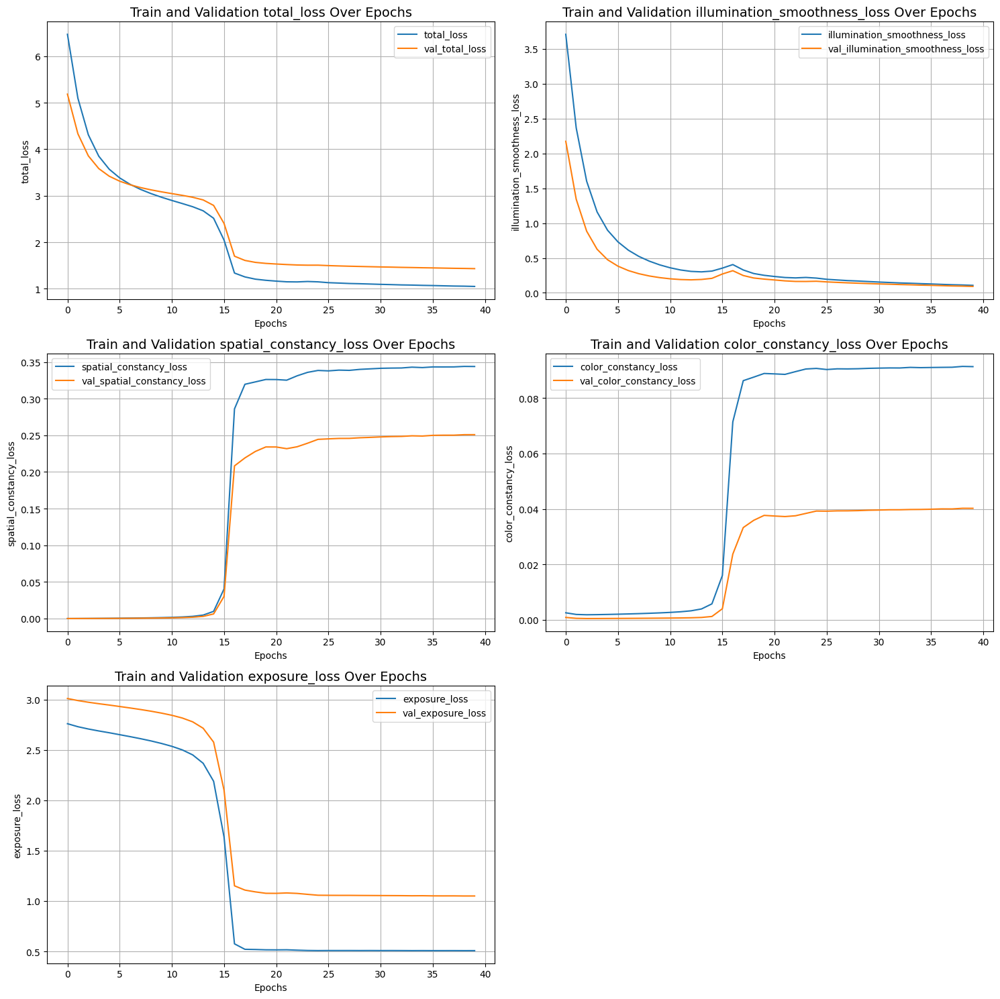

In [ ]:
zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate=1e-4)
# zero_dce_model.load_weights('/content/model.h5')
# zero_dce_model.load_weights('/content/drive/MyDrive/zerodcemodel.h5')

history = zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=40)


def plot_results(history, items, cols=2):
    rows = (len(items) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # if more that 1 row we fit in columns
    axes = axes.flatten()

    for idx, item in enumerate(items):
        ax = axes[idx]
        ax.plot(history.history[item], label=item)
        ax.plot(history.history["val_" + item], label="val_" + item)
        ax.set_xlabel("Epochs")
        ax.set_ylabel(item)
        ax.set_title(f"Train and Validation {item} Over Epochs", fontsize=14)
        ax.legend()
        ax.grid()

    # to hide non use plot
    for j in range(len(items), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

metrics = ["total_loss", "illumination_smoothness_loss", "spatial_constancy_loss", "color_constancy_loss", "exposure_loss"]
plot_results(history, metrics)

In [ ]:

def calculate_mse(imageA, imageB):
    # Ensure the images have the same size
    assert imageA.shape == imageB.shape, "Images must have the same dimensions"

    # Compute the Mean Squared Error (MSE)
    mse = np.mean((imageA - imageB) ** 2)
    return mse

def plot_results(images_to_plot, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images_to_plot)):
        fig.add_subplot(1, len(images_to_plot), i + 1).set_title(titles[i])
        _ = plt.imshow(images_to_plot[i])
        plt.axis("off")
    plt.show()
def enhance_image(input_image):
    image_array = keras.preprocessing.image.img_to_array(input_image)
    image_array = image_array.astype("float32") / 255.0
    image_array = np.expand_dims(image_array, axis=0)
    output_image = zero_dce_model(image_array)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

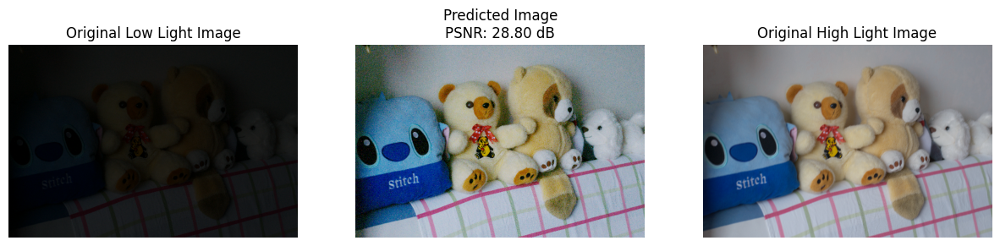

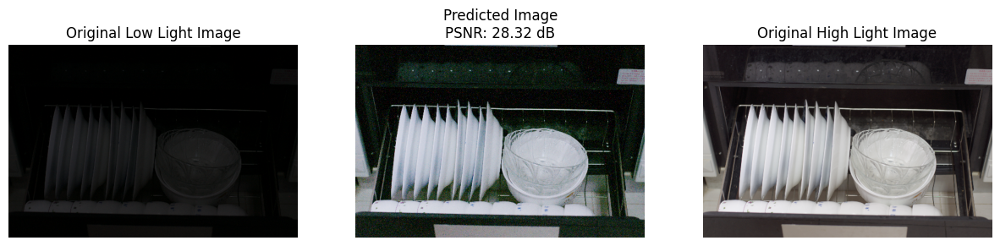

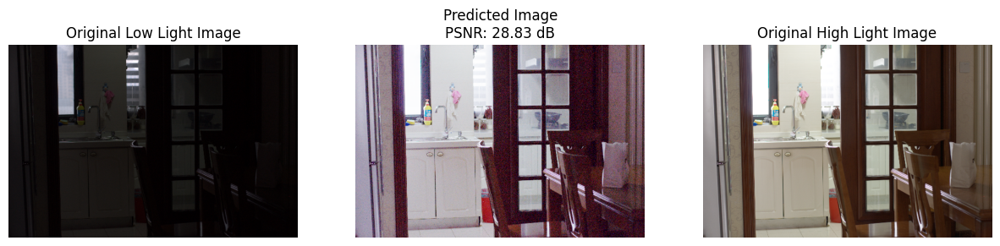

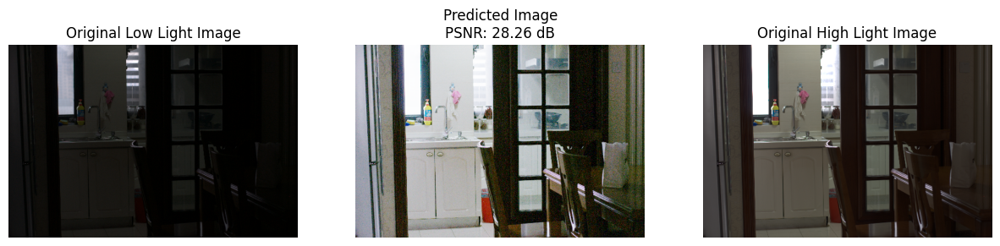

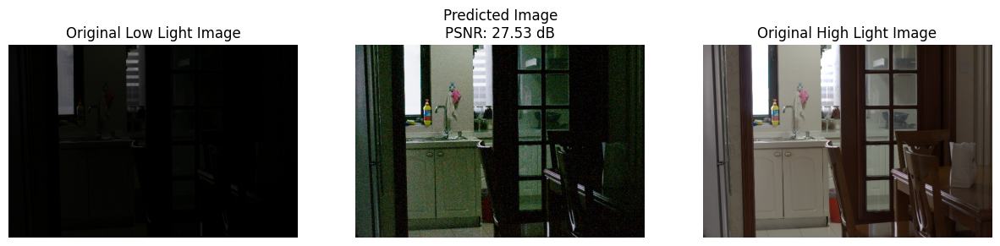

...

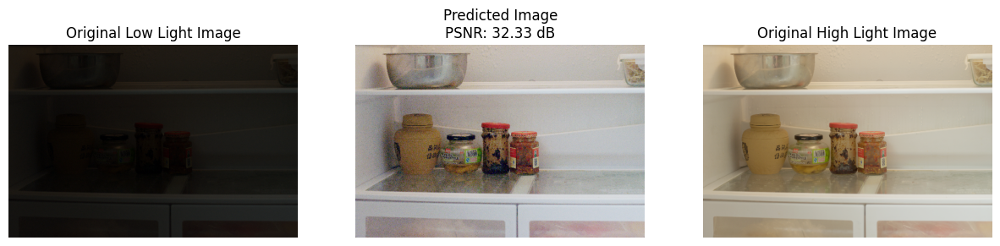

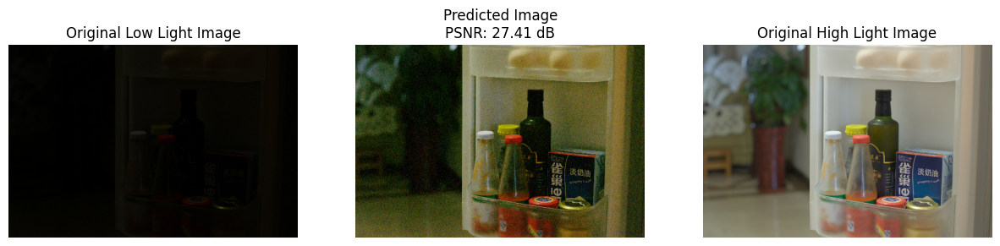

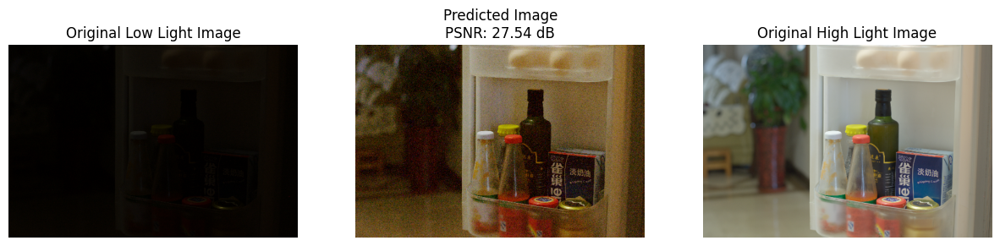

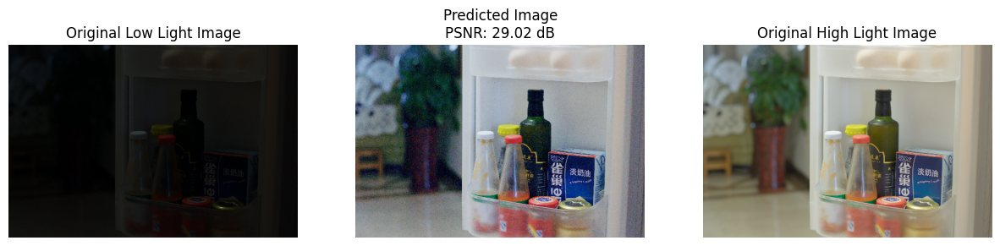

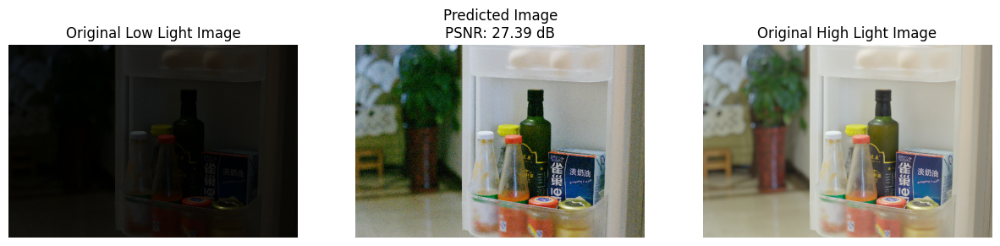

Overall PSNR: 28.12 dB


In [ ]:
first_25_images = test_image_paths[:25]
first_25_high_light_images = high_light_images[:25]

def display_images(original_image, enhanced_image, high_light_image, psnr_value):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(original_image)
    axs[0].set_title("Original Low Light Image")
    axs[0].axis('off')

    axs[1].imshow(enhanced_image)
    axs[1].set_title(f"Predicted Image\nPSNR: {psnr_value:.2f} dB")
    axs[1].axis('off')

    axs[2].imshow(high_light_image)
    axs[2].set_title("Original High Light Image")
    axs[2].axis('off')

    plt.show()
# will store images and titles here
images_to_display = []
titles = []
psnr_values = []

# will display the first 25 images beacuse showing complete dataset would make it messy
for val_image_file, high_light_file in zip(first_25_images, first_25_high_light_images):
    original_image = Image.open(val_image_file)
    enhanced_image = enhance_image(original_image)
    high_light_image = Image.open(high_light_file)

    # Convert images to displayable format
    original_image_np = np.array(original_image)
    enhanced_image_np = np.array(enhanced_image)
    high_light_image_np = np.array(high_light_image)

    # If the images are RGB, convert them to grayscale for PSNR calculation
    if original_image_np.ndim == 3:
        original_image_np = cv2.cvtColor(original_image_np, cv2.COLOR_RGB2GRAY)
    if enhanced_image_np.ndim == 3:
        enhanced_image_np = cv2.cvtColor(enhanced_image_np, cv2.COLOR_RGB2GRAY)
    if high_light_image_np.ndim == 3:
        high_light_image_np = cv2.cvtColor(high_light_image_np, cv2.COLOR_RGB2GRAY)

    psnr_value = compute_psnr(high_light_image_np, enhanced_image_np)
    psnr_values.append(psnr_value)

    display_images(np.array(original_image), np.array(enhanced_image), np.array(high_light_image), psnr_value)

# taking average
overall_psnr = np.mean(psnr_values)


print(f"Overall PSNR: {overall_psnr:.2f} dB" )



In [ ]:
# zero_dce_model.save_weights('/content/drive/MyDrive/zerodcemodel.h5')

